# Prism Data

In [1]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt

In [2]:
consdf = pd.read_parquet('/uss/hdsi-prismdata/q2-ucsd-consDF.pqt')
consdf[consdf['DQ_TARGET'] == 0]

,prism_consumer_id,evaluation_date,credit_score,DQ_TARGET
0,0,2021-09-01,726.0,0.0
1,1,2021-07-01,626.0,0.0
2,2,2021-05-01,680.0,0.0
3,3,2021-03-01,734.0,0.0
4,4,2021-10-01,676.0,0.0
...,...,...,...,...
13995,13995,2022-01-22,802.0,0.0
13996,13996,2022-02-01,652.0,0.0
13997,13997,2021-12-24,765.0,0.0
13998,13998,2022-01-30,685.0,0.0


In [3]:
acctdf = pd.read_parquet('/uss/hdsi-prismdata/q2-ucsd-acctDF.pqt')
acctdf

,prism_consumer_id,prism_account_id,account_type,balance_date,balance
0,3023,0,SAVINGS,2021-08-31,90.57
1,3023,1,CHECKING,2021-08-31,225.95
2,4416,2,SAVINGS,2022-03-31,15157.17
3,4416,3,CHECKING,2022-03-31,66.42
4,4227,4,CHECKING,2021-07-31,7042.90
...,...,...,...,...,...
24461,11500,24461,CHECKING,2022-03-27,732.75
24462,11615,24462,SAVINGS,2022-03-30,5.00
24463,11615,24463,CHECKING,2022-03-30,1956.46
24464,12210,24464,CHECKING,2022-03-28,2701.51


In [4]:
trxndf = pd.read_parquet('/uss/hdsi-prismdata/q2-ucsd-trxnDF.pqt')
trxndf

,prism_consumer_id,prism_transaction_id,category,amount,credit_or_debit,posted_date
0,3023,0,4,0.05,CREDIT,2021-04-16
1,3023,1,12,481.56,CREDIT,2021-04-30
2,3023,2,4,0.05,CREDIT,2021-05-16
3,3023,3,4,0.07,CREDIT,2021-06-16
4,3023,4,4,0.06,CREDIT,2021-07-16
...,...,...,...,...,...,...
6407316,10533,6405304,31,4.96,DEBIT,2022-03-11
6407317,10533,6405305,12,63.48,DEBIT,2022-03-30
6407318,10533,6405306,12,53.99,DEBIT,2022-03-30
6407319,10533,6405307,12,175.98,DEBIT,2022-03-31


In [5]:
cat_map = pd.read_csv('/uss/hdsi-prismdata/q2-ucsd-cat-map.csv')
cat_map

,category_id,category
0,0,SELF_TRANSFER
1,1,EXTERNAL_TRANSFER
2,2,DEPOSIT
3,3,PAYCHECK
4,4,MISCELLANEOUS
5,5,PAYCHECK_PLACEHOLDER
6,6,REFUND
7,7,INVESTMENT_INCOME
8,8,OTHER_BENEFITS
9,9,UNEMPLOYMENT_BENEFITS


In [6]:
cat_map['category'].to_list()

['SELF_TRANSFER',
 'EXTERNAL_TRANSFER',
 'DEPOSIT',
 'PAYCHECK',
 'MISCELLANEOUS',
 'PAYCHECK_PLACEHOLDER',
 'REFUND',
 'INVESTMENT_INCOME',
 'OTHER_BENEFITS',
 'UNEMPLOYMENT_BENEFITS',
 'SMALL_DOLLAR_ADVANCE',
 'TAX',
 'LOAN',
 'INSURANCE',
 'FOOD_AND_BEVERAGES',
 'UNCATEGORIZED',
 'GENERAL_MERCHANDISE',
 'AUTOMOTIVE',
 'GROCERIES',
 'ATM_CASH',
 'ENTERTAINMENT',
 'TRAVEL',
 'ESSENTIAL_SERVICES',
 'ACCOUNT_FEES',
 'HOME_IMPROVEMENT',
 'OVERDRAFT',
 'CREDIT_CARD_PAYMENT',
 'HEALTHCARE_MEDICAL',
 'PETS',
 'EDUCATION',
 'GIFTS_DONATIONS',
 'BILLS_UTILITIES',
 'MORTGAGE',
 'CHILD_DEPENDENTS',
 'RENT',
 'BNPL',
 'AUTO_LOAN',
 'BANKING_CATCH_ALL',
 'DEBT',
 'FITNESS',
 'TRANSPORATION',
 'LEGAL',
 'GOVERNMENT_SERVICES',
 'RISK_CATCH_ALL',
 'RTO_LTO',
 'INVESTMENT',
 'GAMBLING',
 'CORPORATE_PAYMENTS',
 'TIME_OR_STUFF',
 'PENSION']

In [64]:
consdf['prism_consumer_id'].nunique()

15000

In [7]:
trxndf['prism_consumer_id'].nunique()

14492

In [8]:
acctdf['prism_consumer_id'].nunique()

13009

In [9]:
import pandas as pd
import numpy as np

# ensure date type
trxndf['posted_date'] = pd.to_datetime(trxndf['posted_date'])

features = (
    trxndf
    .groupby('prism_consumer_id')
    .agg(
        txn_count=('prism_transaction_id', 'count'),
        total_amount=('amount', 'sum'),
        avg_amount=('amount', 'mean'),
        max_amount=('amount', 'max'),

        credit_count=('credit_or_debit', lambda x: (x == 'CREDIT').sum()),
        debit_count=('credit_or_debit', lambda x: (x == 'DEBIT').sum()),

        credit_amount=('amount', lambda x: x[trxndf.loc[x.index, 'credit_or_debit'] == 'CREDIT'].sum()),
        debit_amount=('amount', lambda x: x[trxndf.loc[x.index, 'credit_or_debit'] == 'DEBIT'].sum()),

        active_days=('posted_date', 'nunique'),
        category_count=('category', 'nunique')
    )
    .reset_index()
)

# ratios (very predictive)
features['credit_debit_ratio'] = (
    features['credit_amount'] / (features['debit_amount'] + 1)
)


In [10]:
model_df = features.merge(
    consdf[['prism_consumer_id', 'DQ_TARGET']],
    on='prism_consumer_id',
    how='inner'
)

In [11]:
model_df = model_df.dropna()

In [12]:
from sklearn.model_selection import train_test_split

X = model_df.drop(columns=['prism_consumer_id', 'DQ_TARGET'])
y = model_df['DQ_TARGET']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)


In [13]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LogisticRegression(class_weight='balanced', max_iter=1000))
])

pipe.fit(X_train, y_train)


Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 LogisticRegression(class_weight='balanced', max_iter=1000))])

In [14]:
from sklearn.metrics import roc_auc_score, classification_report

y_pred = pipe.predict(X_test)
y_prob = pipe.predict_proba(X_test)[:, 1]

print("ROC AUC:", roc_auc_score(y_test, y_prob))
print(classification_report(y_test, y_pred))

ROC AUC: 0.7448682860075266
              precision    recall  f1-score   support

         0.0       0.97      0.62      0.75      2664
         1.0       0.15      0.76      0.25       237

    accuracy                           0.63      2901
   macro avg       0.56      0.69      0.50      2901
weighted avg       0.90      0.63      0.71      2901



In [15]:
from xgboost import XGBClassifier

xgb = XGBClassifier(
    n_estimators=300,
    max_depth=5,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='auc'
)

xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='auc', feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.05, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=300,
              n_jobs=None, num_parallel_tree=None, ...)

In [16]:
import pandas as pd

importance = pd.Series(
    xgb.feature_importances_,
    index=X_train.columns
).sort_values(ascending=False)

importance.head(10)

active_days           0.130403
credit_debit_ratio    0.096705
txn_count             0.095329
debit_count           0.094741
credit_amount         0.094309
category_count        0.090299
credit_count          0.087465
avg_amount            0.083475
max_amount            0.078092
debit_amount          0.075781
dtype: float32

In [17]:
features['prism_consumer_id'].nunique()

14492

In [18]:
trxndf['prism_consumer_id'].nunique()

14492

In [19]:
acctdf['prism_consumer_id'].nunique()

13009

In [20]:
consdf.shape

(15000, 4)

## Feature Creation

In [21]:
all_ids = pd.concat([
    trxndf['prism_consumer_id'],
    acctdf['prism_consumer_id'],
    consdf['prism_consumer_id']
]).dropna().unique()
all_ids.shape

(15000,)

In [22]:
result = (
    acctdf
    .merge(consdf, on='prism_consumer_id', how='inner')
    .groupby(['prism_consumer_id'])
    .agg(
        balance=('balance', 'sum'),
        balance_date=('balance_date', 'max')
    )
    .reset_index()
)
result

,prism_consumer_id,balance,balance_date
0,0,320.37,2021-08-31
1,1,3302.42,2021-06-30
2,10,824.24,2022-01-31
3,100,2655.47,2022-12-31
4,1000,95.25,2023-01-31
...,...,...,...
13004,9995,0.00,2023-03-02
13005,9996,252.67,2023-10-11
13006,9997,611.28,2023-05-25
13007,9998,-862.99,2023-11-02


In [23]:
trxndf

,prism_consumer_id,prism_transaction_id,category,amount,credit_or_debit,posted_date
0,3023,0,4,0.05,CREDIT,2021-04-16
1,3023,1,12,481.56,CREDIT,2021-04-30
2,3023,2,4,0.05,CREDIT,2021-05-16
3,3023,3,4,0.07,CREDIT,2021-06-16
4,3023,4,4,0.06,CREDIT,2021-07-16
...,...,...,...,...,...,...
6407316,10533,6405304,31,4.96,DEBIT,2022-03-11
6407317,10533,6405305,12,63.48,DEBIT,2022-03-30
6407318,10533,6405306,12,53.99,DEBIT,2022-03-30
6407319,10533,6405307,12,175.98,DEBIT,2022-03-31


In [24]:
final_df = result.merge(trxndf,on='prism_consumer_id')

In [25]:
final_df

,prism_consumer_id,balance,balance_date,prism_transaction_id,category,amount,credit_or_debit,posted_date
0,0,320.37,2021-08-31,136696,4,0.09,CREDIT,2021-03-19
1,0,320.37,2021-08-31,136697,4,0.05,CREDIT,2021-04-16
2,0,320.37,2021-08-31,136698,4,0.06,CREDIT,2021-05-21
3,0,320.37,2021-08-31,136699,4,0.04,CREDIT,2021-06-18
4,0,320.37,2021-08-31,136700,4,0.02,CREDIT,2021-07-16
...,...,...,...,...,...,...,...,...
5202934,9999,-9.02,2023-08-09,1522635,16,66.63,DEBIT,2023-08-08
5202935,9999,-9.02,2023-08-09,1522636,14,16.91,DEBIT,2023-08-08
5202936,9999,-9.02,2023-08-09,1522637,14,3.52,DEBIT,2023-08-08
5202937,9999,-9.02,2023-08-09,1522638,16,7.99,DEBIT,2023-08-08


In [26]:
mapping = dict(zip(cat_map["category_id"], cat_map["category"]))
final_df["category"] = final_df["category"].replace(mapping)
final_df['amount'] = np.where(final_df['credit_or_debit'] == 'DEBIT', -final_df['amount'],final_df['amount'])
final_df['posted_date'] = pd.to_datetime(final_df['posted_date'])
monthly_summary = (
    final_df
    .groupby(['prism_consumer_id', final_df['posted_date'].dt.to_period('M')])
    .agg(
        last_balance_date=('posted_date', 'max'),
        starting_balance=('balance', 'first'),
        monthly_total=('balance', 'sum')
    )
    .reset_index()
)
monthly_summary['posted_date'] = monthly_summary['posted_date'].dt.to_timestamp()

In [27]:
monthly_summary = monthly_summary.merge(consdf[['prism_consumer_id','DQ_TARGET']],on='prism_consumer_id').dropna()

In [28]:
test_df = monthly_summary.drop(columns="last_balance_date")

# ensure date type
test_df["posted_date"] = pd.to_datetime(test_df["posted_date"])

# sort properly
test_df = test_df.sort_values(["prism_consumer_id", "posted_date"])

# calculate running balance
test_df["monthly_balance"] = (
    test_df["starting_balance"]
    + test_df.groupby("prism_consumer_id")["monthly_total"].cumsum()
)
test_df

,prism_consumer_id,posted_date,starting_balance,monthly_total,DQ_TARGET,monthly_balance
0,0,2021-03-01,320.37,10572.21,0.0,10892.58
1,0,2021-04-01,320.37,22105.53,0.0,32998.11
2,0,2021-05-01,320.37,11853.69,0.0,44851.80
3,0,2021-06-01,320.37,27231.45,0.0,72083.25
4,0,2021-07-01,320.37,23707.38,0.0,95790.63
...,...,...,...,...,...,...
74439,999,2020-11-01,2236.37,140891.31,0.0,237055.22
74440,999,2020-12-01,2236.37,351110.09,0.0,588165.31
74441,999,2021-01-01,2236.37,272837.14,0.0,861002.45
74442,999,2021-02-01,2236.37,339928.24,0.0,1200930.69


In [29]:
del_df = test_df[test_df['DQ_TARGET'] == 1]
nondel_df = test_df[test_df['DQ_TARGET'] == 0]

In [30]:
ids_1 = del_df["prism_consumer_id"].dropna().unique()
ids_0 = del_df["prism_consumer_id"].dropna().unique()

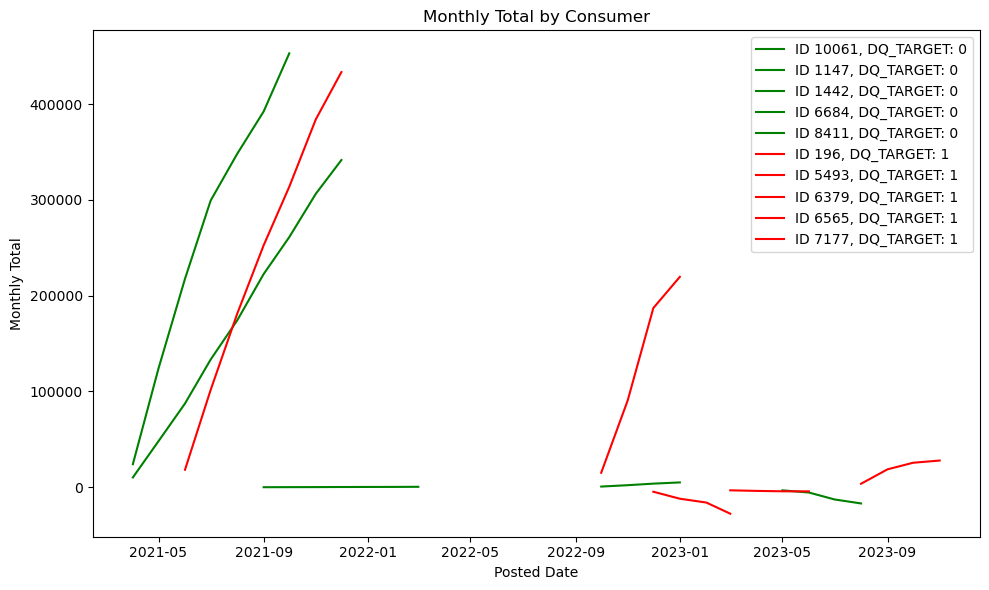

In [31]:
random.seed(10)

n=5

ids = np.random.choice(ids_0, size=n, replace=False)
ids2 = np.random.choice(ids_1,size=n,replace=False)

subset = test_df[
    test_df['prism_consumer_id'].isin(ids)
]
subset2 = test_df[
    test_df['prism_consumer_id'].isin(ids2)
]

plt.figure(figsize=(10, 6))

for pid, df in subset.groupby('prism_consumer_id'):
    plt.plot(df['posted_date'], df['monthly_balance'], label=f'ID {pid}, DQ_TARGET: 0',color='green')
    
for pid, df in subset2.groupby('prism_consumer_id'):
    plt.plot(df['posted_date'], df['monthly_balance'], label=f'ID {pid}, DQ_TARGET: 1',color='red')

plt.xlabel('Posted Date')
plt.ylabel('Monthly Total')
plt.title('Monthly Total by Consumer')
plt.legend()
plt.tight_layout()
plt.show()

In [32]:
monthly_summary

,prism_consumer_id,posted_date,last_balance_date,starting_balance,monthly_total,DQ_TARGET
0,0,2021-03-01,2021-03-31,320.37,10572.21,0.0
1,0,2021-04-01,2021-04-29,320.37,22105.53,0.0
2,0,2021-05-01,2021-05-31,320.37,11853.69,0.0
3,0,2021-06-01,2021-06-30,320.37,27231.45,0.0
4,0,2021-07-01,2021-07-30,320.37,23707.38,0.0
...,...,...,...,...,...,...
74439,999,2020-11-01,2020-11-30,2236.37,140891.31,0.0
74440,999,2020-12-01,2020-12-31,2236.37,351110.09,0.0
74441,999,2021-01-01,2021-01-25,2236.37,272837.14,0.0
74442,999,2021-02-01,2021-02-28,2236.37,339928.24,0.0


In [33]:
monthly_summary = monthly_summary.sort_values(by='prism_consumer_id')
month_df = monthly_summary.merge(consdf[['prism_consumer_id','DQ_TARGET']], on = 'prism_consumer_id').dropna()

In [34]:
month_df['monthly_total'] = month_df['monthly_total'] + month_df['starting_balance']

In [35]:
month_df = month_df.drop(columns=['starting_balance','last_balance_date'])

In [36]:
month_df['DQ_TARGET'] = month_df['DQ_TARGET_x']
month_df = month_df.drop(columns=['DQ_TARGET_x','DQ_TARGET_y'])
month_df

,prism_consumer_id,posted_date,monthly_total,DQ_TARGET
0,0,2021-03-01,10892.58,0.0
1,0,2021-04-01,22425.90,0.0
2,0,2021-05-01,12174.06,0.0
3,0,2021-06-01,27551.82,0.0
4,0,2021-07-01,24027.75,0.0
...,...,...,...,...
59753,999,2021-02-01,342164.61,0.0
59754,999,2020-10-01,53672.88,0.0
59755,999,2020-09-01,44727.40,0.0
59756,999,2020-11-01,143127.68,0.0


In [37]:
mtotal_df = month_df.groupby('prism_consumer_id').agg(
        DQ_TARGET = ('DQ_TARGET', 'first'),
        monthly_total=('monthly_total', 'mean')
    )
mtotal_df

,DQ_TARGET,monthly_total
prism_consumer_id,,
0,0.0,1.899336e+04
1,0.0,1.514395e+05
10,0.0,4.097650e+04
100,0.0,5.665003e+04
1000,0.0,2.966357e+03
...,...,...
995,0.0,2.149466e+06
996,0.0,0.000000e+00
997,0.0,4.854764e+06


In [38]:
from sklearn.model_selection import train_test_split

X = mtotal_df.drop(columns=['DQ_TARGET'])
y = mtotal_df['DQ_TARGET']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LogisticRegression(class_weight='balanced', max_iter=1000))
])

pipe.fit(X_train, y_train)


Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 LogisticRegression(class_weight='balanced', max_iter=1000))])

In [39]:
from sklearn.metrics import roc_auc_score, classification_report

y_pred = pipe.predict(X_test)
y_prob = pipe.predict_proba(X_test)[:, 1]

print("ROC AUC:", roc_auc_score(y_test, y_prob))
print(classification_report(y_test, y_pred))


ROC AUC: 0.6809655227581792
              precision    recall  f1-score   support

         0.0       0.96      0.28      0.43      2315
         1.0       0.10      0.89      0.18       216

    accuracy                           0.33      2531
   macro avg       0.53      0.58      0.31      2531
weighted avg       0.89      0.33      0.41      2531



In [40]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(
    n_estimators=500,
    max_depth=10,
    class_weight='balanced',
    random_state=42,
    n_jobs=-1
)

model.fit(X_train, y_train)

y_prob = model.predict_proba(X_test)[:, 1]
print("ROC AUC:", roc_auc_score(y_test, y_prob))


ROC AUC: 0.6028007759379249


In [41]:
nones_cat = ['PETS','GAMBLING','ENTERTAINMENT']
nones_df = final_df[final_df['category'].isin(nones_cat)]
nones_df = nones_df.merge(consdf[['prism_consumer_id','DQ_TARGET']], on = 'prism_consumer_id').dropna()
#nones_df.groupby('prism_consumer_id','credit_or_debit').sum()
avg_df = nones_df[['prism_consumer_id','amount','DQ_TARGET']].groupby('prism_consumer_id').mean()

In [42]:
from sklearn.model_selection import train_test_split

X = avg_df.drop(columns=['DQ_TARGET'])
y = avg_df['DQ_TARGET']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LogisticRegression(class_weight='balanced', max_iter=1000))
])

pipe.fit(X_train, y_train)

from sklearn.metrics import roc_auc_score, classification_report

y_pred = pipe.predict(X_test)
y_prob = pipe.predict_proba(X_test)[:, 1]

print("ROC AUC:", roc_auc_score(y_test, y_prob))
print(classification_report(y_test, y_pred))


ROC AUC: 0.5686370557476895
              precision    recall  f1-score   support

         0.0       0.93      0.30      0.45      1862
         1.0       0.10      0.79      0.18       182

    accuracy                           0.34      2044
   macro avg       0.52      0.54      0.31      2044
weighted avg       0.86      0.34      0.43      2044



In [43]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(
    n_estimators=500,
    max_depth=10,
    class_weight='balanced',
    random_state=42,
    n_jobs=-1
)

model.fit(X_train, y_train)

y_prob = model.predict_proba(X_test)[:, 1]
print("ROC AUC:", roc_auc_score(y_test, y_prob))


ROC AUC: 0.5325834208755799


In [44]:
total_df = nones_df[['prism_consumer_id','amount','DQ_TARGET']].groupby('prism_consumer_id').agg(
        amount=('amount', 'sum'),
        DQ_TARGET=('DQ_TARGET', 'first')
    )
total_df

,amount,DQ_TARGET
prism_consumer_id,,
0,-477.09,0.0
1,-585.59,0.0
10,-273.64,0.0
10000,-561.41,0.0
10001,-1445.54,0.0
...,...,...
994,-1078.77,0.0
996,-1633.34,0.0
997,-747.49,0.0


In [45]:
cost_df = (final_df[['prism_consumer_id','balance','amount']]
    .groupby('prism_consumer_id')
    .agg(
        balance = ('balance','first'),
        amount = ('amount','sum')
    )
)

In [46]:
from sklearn.model_selection import train_test_split

X = total_df.drop(columns=['DQ_TARGET'])
y = total_df['DQ_TARGET']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LogisticRegression(class_weight='balanced', max_iter=1000))
])

pipe.fit(X_train, y_train)

from sklearn.metrics import roc_auc_score, classification_report

y_pred = pipe.predict(X_test)
y_prob = pipe.predict_proba(X_test)[:, 1]

print("ROC AUC:", roc_auc_score(y_test, y_prob))
print(classification_report(y_test, y_pred))


ROC AUC: 0.60385854746757
              precision    recall  f1-score   support

         0.0       0.94      0.29      0.45      1862
         1.0       0.10      0.81      0.18       182

    accuracy                           0.34      2044
   macro avg       0.52      0.55      0.31      2044
weighted avg       0.86      0.34      0.42      2044



### Comparing Discretionary spending to Other Categories to see if they best help our binary classifier

In [47]:
final_df = consdf.merge(trxndf,on='prism_consumer_id')
final_df = final_df[np.isnan(final_df['DQ_TARGET']) == False][['prism_consumer_id','category','amount','DQ_TARGET']]
final_df['DQ_TARGET'].unique()

array([0., 1.])

In [48]:
mapping = dict(zip(cat_map["category_id"], cat_map["category"]))
final_df["category"] = final_df["category"].replace(mapping)
final_df

,prism_consumer_id,category,amount,DQ_TARGET
0,0,MISCELLANEOUS,0.09,0.0
1,0,MISCELLANEOUS,0.05,0.0
2,0,MISCELLANEOUS,0.06,0.0
3,0,MISCELLANEOUS,0.04,0.0
4,0,MISCELLANEOUS,0.02,0.0
...,...,...,...,...
5709915,13999,MISCELLANEOUS,14.38,0.0
5709916,13999,SELF_TRANSFER,2.00,0.0
5709917,13999,FOOD_AND_BEVERAGES,41.23,0.0
5709918,13999,ENTERTAINMENT,107.98,0.0


In [49]:
final_df[final_df['prism_consumer_id'] == '999'][['category','amount']].groupby('category').sum()

,amount
category,
ATM_CASH,5101.08
AUTOMOTIVE,1240.73
BANKING_CATCH_ALL,840.00
CREDIT_CARD_PAYMENT,780.00
DEPOSIT,18184.26
ENTERTAINMENT,2355.67
EXTERNAL_TRANSFER,2087.15
FOOD_AND_BEVERAGES,1100.71
GAMBLING,659.33


In [50]:
import pandas as pd

# df is your dataframe
comparison = (
    final_df
    .groupby(['category', 'DQ_TARGET'])
    .size()
    .unstack(fill_value=0)
    .rename(columns={0: 'DQ_0_count', 1: 'DQ_1_count'})
    .reset_index()
)

comparison

DQ_TARGET,category,DQ_0_count,DQ_1_count
0,ACCOUNT_FEES,40942,4490
1,ATM_CASH,76700,7961
2,AUTOMOTIVE,351322,31260
3,AUTO_LOAN,10273,934
4,BANKING_CATCH_ALL,15414,1152
5,BILLS_UTILITIES,34631,2372
6,BNPL,66949,9426
7,CHILD_DEPENDENTS,1543,146
8,CORPORATE_PAYMENTS,275,18
9,CREDIT_CARD_PAYMENT,140366,8982


In [51]:
comparison_amt = (
    final_df
    .groupby(['category', 'DQ_TARGET'])['amount']
    .sum()
    .unstack(fill_value=0)
    .rename(columns={0: 'DQ_0_amount', 1: 'DQ_1_amount'})
    .reset_index()
)

comparison_amt


DQ_TARGET,category,DQ_0_amount,DQ_1_amount
0,ACCOUNT_FEES,2.229176e+05,23851.88
1,ATM_CASH,2.649716e+07,2809868.44
2,AUTOMOTIVE,9.527978e+06,775736.39
3,AUTO_LOAN,5.038603e+06,392040.32
4,BANKING_CATCH_ALL,3.803601e+06,212247.12
5,BILLS_UTILITIES,4.436876e+06,297097.24
6,BNPL,3.027620e+06,379117.63
7,CHILD_DEPENDENTS,2.485350e+05,26245.56
8,CORPORATE_PAYMENTS,1.719676e+05,14716.03
9,CREDIT_CARD_PAYMENT,3.279424e+07,1558070.25


In [52]:
comparison_pct = comparison.copy()

total = comparison_pct['DQ_0_count'] + comparison_pct['DQ_1_count']
comparison_pct['DQ_0_pct'] = comparison_pct['DQ_0_count'] / total
comparison_pct['DQ_1_pct'] = comparison_pct['DQ_1_count'] / total

comparison_pct

DQ_TARGET,category,DQ_0_count,DQ_1_count,DQ_0_pct,DQ_1_pct
0,ACCOUNT_FEES,40942,4490,0.901171,0.098829
1,ATM_CASH,76700,7961,0.905966,0.094034
2,AUTOMOTIVE,351322,31260,0.918292,0.081708
3,AUTO_LOAN,10273,934,0.916659,0.083341
4,BANKING_CATCH_ALL,15414,1152,0.930460,0.069540
5,BILLS_UTILITIES,34631,2372,0.935897,0.064103
6,BNPL,66949,9426,0.876583,0.123417
7,CHILD_DEPENDENTS,1543,146,0.913558,0.086442
8,CORPORATE_PAYMENTS,275,18,0.938567,0.061433
9,CREDIT_CARD_PAYMENT,140366,8982,0.939859,0.060141


In [53]:
comparison_pct.sort_values('DQ_1_pct', ascending=False)

DQ_TARGET,category,DQ_0_count,DQ_1_count,DQ_0_pct,DQ_1_pct
18,GAMBLING,14156,3016,0.824365,0.175635
33,OVERDRAFT,11109,2040,0.844855,0.155145
6,BNPL,66949,9426,0.876583,0.123417
40,RTO_LTO,6389,828,0.885271,0.114729
29,LOAN,88928,10476,0.894612,0.105388
0,ACCOUNT_FEES,40942,4490,0.901171,0.098829
10,DEBT,1694,178,0.904915,0.095085
15,EXTERNAL_TRANSFER,496490,51745,0.905615,0.094385
1,ATM_CASH,76700,7961,0.905966,0.094034
37,REFUND,43249,4273,0.910084,0.089916


In [54]:
# Aggregate 'amount' by sum, but keep 'DQ_TARGET' as its original value
final_df = final_df.groupby(['prism_consumer_id', 'category'], as_index=False).agg({
    'amount': 'count',
    'DQ_TARGET': 'first' 
})
final_df

,prism_consumer_id,category,amount,DQ_TARGET
0,0,ATM_CASH,3,0.0
1,0,AUTOMOTIVE,21,0.0
2,0,BANKING_CATCH_ALL,5,0.0
3,0,DEPOSIT,1,0.0
4,0,ENTERTAINMENT,6,0.0
...,...,...,...,...
224812,999,REFUND,14,0.0
224813,999,RENT,15,0.0
224814,999,SELF_TRANSFER,24,0.0
224815,999,TRANSPORATION,3,0.0


In [55]:
final_df.groupby(['DQ_TARGET','category']).agg({
    'amount': 'count',
})

amount
DQ_TARGET category                     
0.0       ACCOUNT_FEES             4657
          ATM_CASH                 7842
          AUTOMOTIVE               9003
          AUTO_LOAN                2087
          BANKING_CATCH_ALL        3375
...                                 ...
1.0       TAX                       251
          TIME_OR_STUFF              28
          TRANSPORATION             651
          TRAVEL                    426
          UNEMPLOYMENT_BENEFITS      24

[94 rows x 1 columns]

In [56]:
final_df['category'].value_counts()/final_df['prism_consumer_id'].nunique()

category
MISCELLANEOUS            0.961727
EXTERNAL_TRANSFER        0.917593
GENERAL_MERCHANDISE      0.899233
FOOD_AND_BEVERAGES       0.876304
AUTOMOTIVE               0.850961
GROCERIES                0.842600
DEPOSIT                  0.801224
ENTERTAINMENT            0.796828
SELF_TRANSFER            0.778640
PAYCHECK                 0.744160
ATM_CASH                 0.742005
TRANSPORATION            0.696147
HEALTHCARE_MEDICAL       0.690458
REFUND                   0.687527
ESSENTIAL_SERVICES       0.655806
CREDIT_CARD_PAYMENT      0.607534
HOME_IMPROVEMENT         0.573916
INSURANCE                0.551849
LOAN                     0.542281
BILLS_UTILITIES          0.492458
TRAVEL                   0.462288
ACCOUNT_FEES             0.450909
TAX                      0.356004
BANKING_CATCH_ALL        0.313766
BNPL                     0.281355
INVESTMENT               0.277821
INVESTMENT_INCOME        0.262305
PETS                     0.251444
EDUCATION                0.247565
RENT 

In [57]:
(final_df[['prism_consumer_id','category']].groupby(['prism_consumer_id','category']).count().reset_index().groupby('category').count()
/final_df['prism_consumer_id'].nunique()).sort_values(by='prism_consumer_id',ascending=False)

,prism_consumer_id
category,
MISCELLANEOUS,0.961727
EXTERNAL_TRANSFER,0.917593
GENERAL_MERCHANDISE,0.899233
FOOD_AND_BEVERAGES,0.876304
AUTOMOTIVE,0.850961
GROCERIES,0.842600
DEPOSIT,0.801224
ENTERTAINMENT,0.796828
SELF_TRANSFER,0.778640


In [58]:
misc_df = final_df[final_df['category'] == 'MISCELLANEOUS']
misc_df[['DQ_TARGET','amount']].groupby('DQ_TARGET', as_index=False).mean()

,DQ_TARGET,amount
0,0.0,45.857993
1,1.0,37.076839


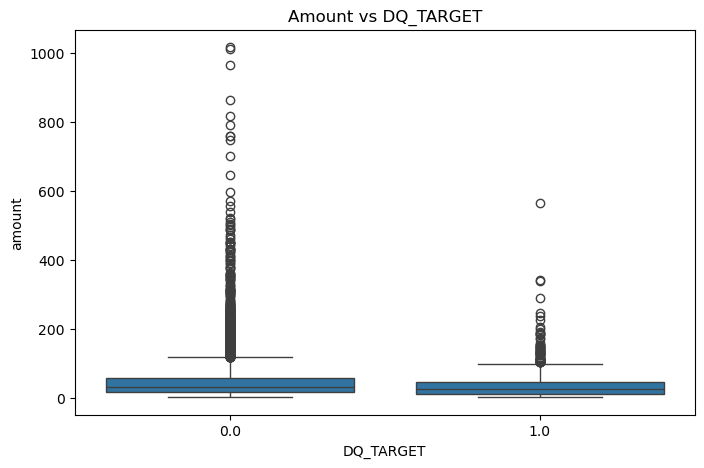

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np


plt.figure(figsize=(8,5))
sns.boxplot(x='DQ_TARGET', y='amount', data=misc_df)
plt.title('Amount vs DQ_TARGET')
plt.show()


In [60]:
(misc_df[misc_df['DQ_TARGET'] == 1]['amount'] < 50000).value_counts()

amount
True    911
Name: count, dtype: int64

In [61]:
(misc_df[misc_df['DQ_TARGET'] == 0]['amount'] < 50000).value_counts()

amount
True    10246
Name: count, dtype: int64

maybe fitness, gifts donations, government services, investment income, pension, LEGAL

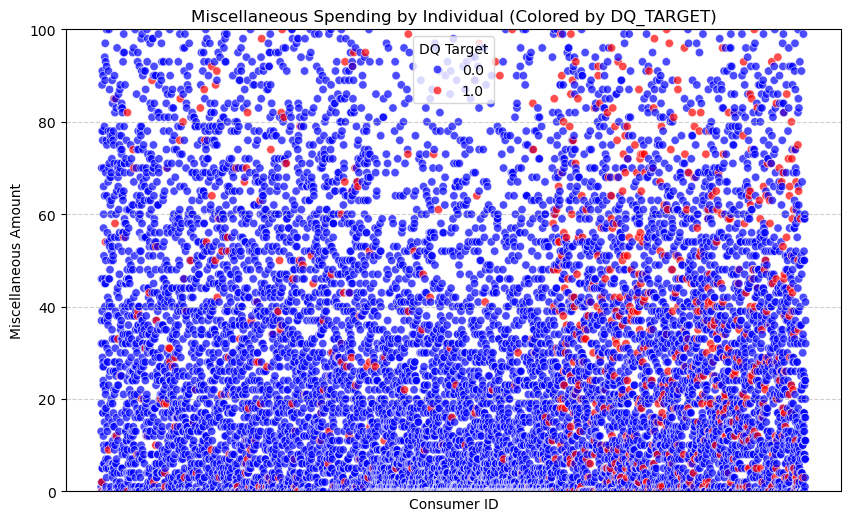

In [62]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Reshape the data so each category is a feature (column)
# We fill NaN with 0 for users who didn't spend in a specific category
df_pivot = final_df.pivot(index=['prism_consumer_id', 'DQ_TARGET'], 
                    columns='category', 
                    values='amount').fillna(0).reset_index()

# 2. Create the Scatter Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df_pivot, 
    x='prism_consumer_id', 
    y='EXTERNAL_TRANSFER', 
    hue='DQ_TARGET', 
    palette={0.0: 'blue', 1.0: 'red'},
    alpha=0.7
)

plt.title('Miscellaneous Spending by Individual (Colored by DQ_TARGET)')
plt.xlabel('Consumer ID')
plt.ylabel('Miscellaneous Amount')
plt.legend(title='DQ Target')
plt.grid(True, linestyle='--', alpha=0.6)
# 1. Zoom into the main concentration (e.g., $0 to $100,000)
plt.ylim(0, 100) 

# 2. Keep the "no grey lines" fixes
plt.grid(False, axis='x')
plt.xticks([])

plt.show()

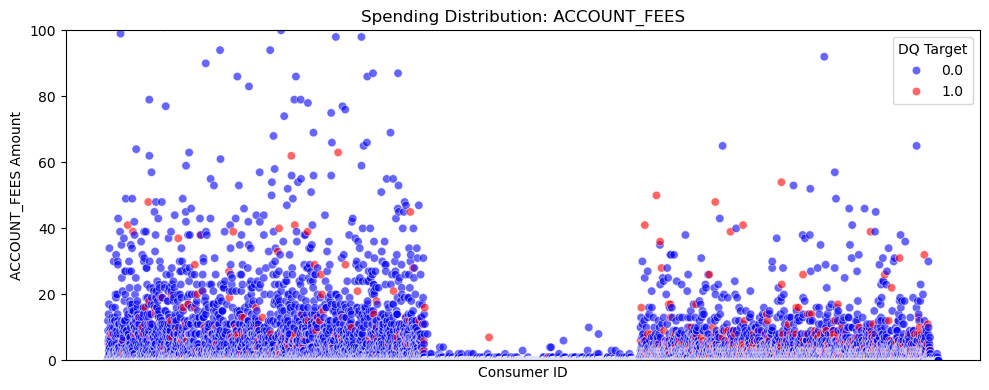

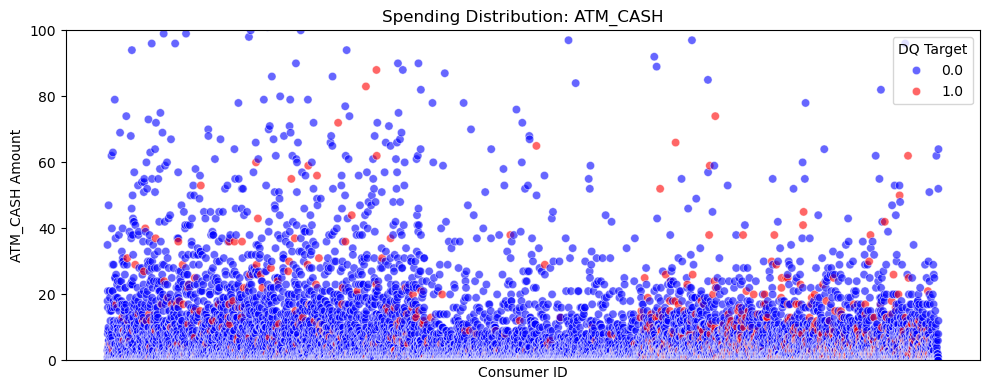

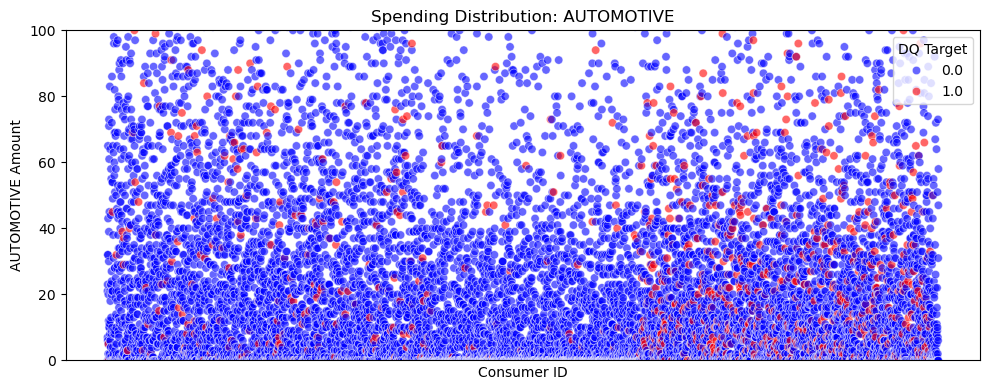

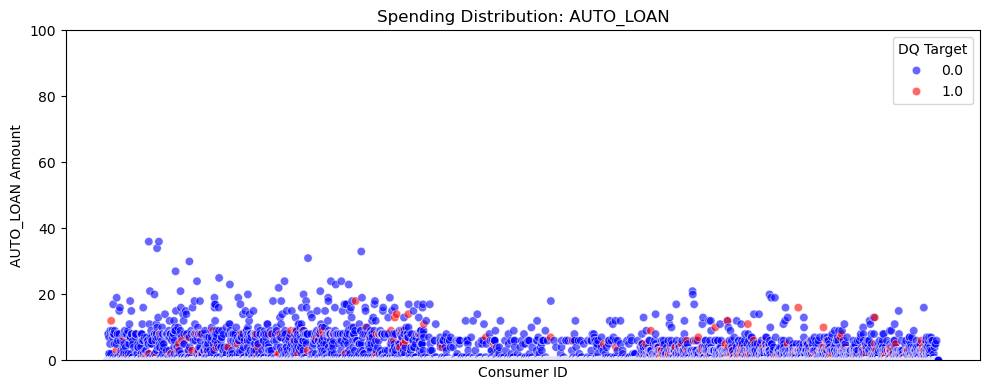

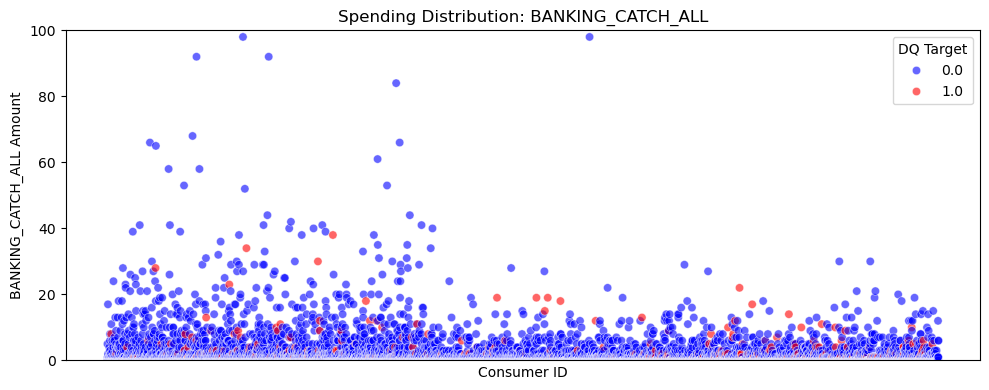

...

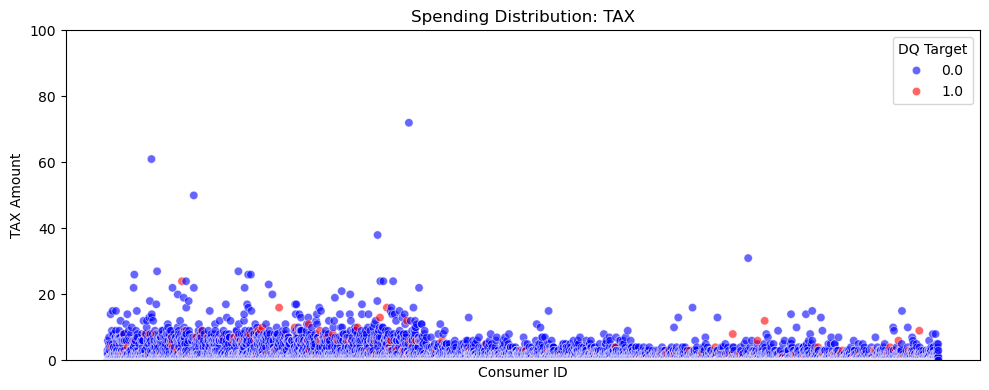

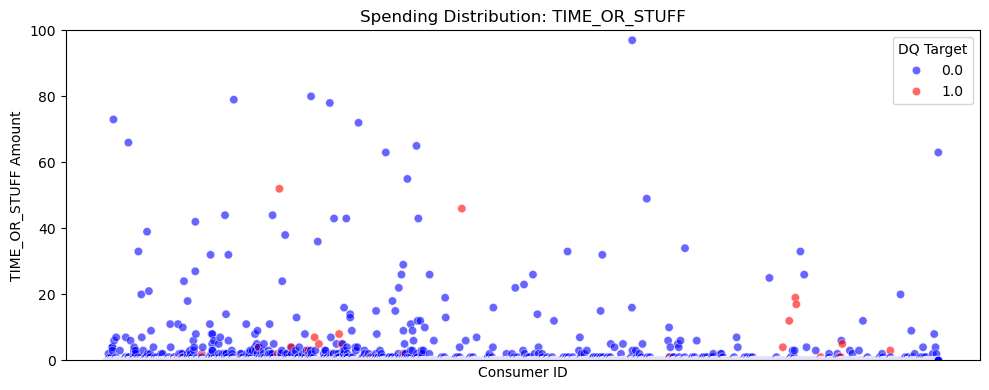

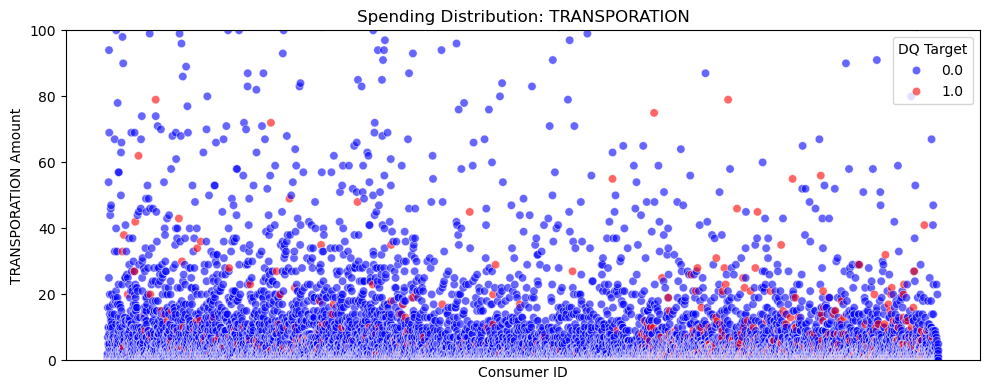

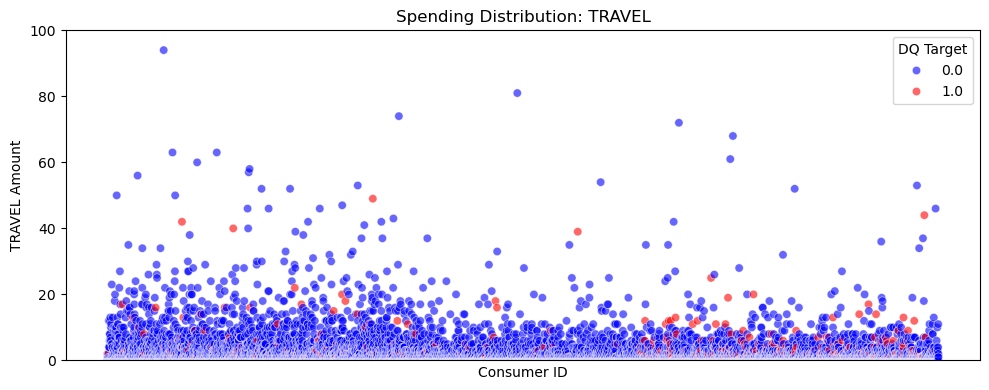

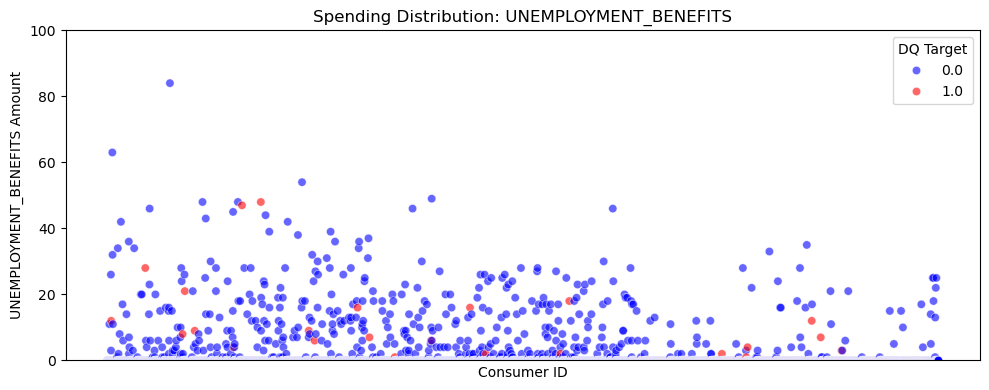

In [63]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Reshape the data
df_pivot = final_df.pivot(index=['prism_consumer_id', 'DQ_TARGET'], 
                    columns='category', 
                    values='amount').fillna(0).reset_index()

# 2. Get a list of all category columns 
# We exclude 'prism_consumer_id' and 'DQ_TARGET'
categories = [col for col in df_pivot.columns if col not in ['prism_consumer_id', 'DQ_TARGET']]

# 3. Loop through each category and create a plot
for cat in categories:
    plt.figure(figsize=(10, 4)) # Smaller height for faster scrolling
    
    sns.scatterplot(
        data=df_pivot, 
        x='prism_consumer_id', 
        y=cat,             # Dynamically set Y to the current category
        hue='DQ_TARGET', 
        palette={0.0: 'blue', 1.0: 'red'},
        alpha=0.6
    )

    # Use the current category name in titles and labels
    plt.title(f'Spending Distribution: {cat}')
    plt.xlabel('Consumer ID')
    plt.ylabel(f'{cat} Amount')
    
    # Formatting fixes
    plt.ylim(0, 100)      # Zoom into main concentration
    plt.grid(False, axis='x')
    plt.xticks([])          # Remove grey blob/labels
    plt.legend(title='DQ Target', loc='upper right')
    
    plt.tight_layout()
    plt.show()

maybe fitness, gifts donations, government services, investment income, pension